In [247]:
!pip install segment_anything
!pip install opencv-python

import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import os
import pandas as pd
torch.cuda.empty_cache() 

In [39]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device);


In [332]:
folder = '../data/leaves/'
folder_out = './leaves/'

imnames = [x for x in os.listdir(folder) if x.endswith('5865.JPG')]  # get list of image files change .JPG is using files of different type

In [340]:
def checkcolour(masks, hsv):
    colours = np.zeros((0,3))

    for i in range(len(masks)):
        color = hsv[masks[i]['segmentation']].mean(axis=(0))
        colours = np.append(colours, color[None, :], axis=0)
    
    # Define a range for hue, saturation, and value (brightness)
    hue_lower_bound = 35
    hue_upper_bound = 100  # or 100 if grow lights are on
    saturation_lower_bound = 30
    value_lower_bound = 20  # Example value, adjust as needed
    value_upper_bound = 255  # Example value, adjust as needed

    idx_green = (colours[:,0] < hue_upper_bound) & (colours[:,0] > hue_lower_bound) & \
                (colours[:,1] > saturation_lower_bound) & \
                (colours[:,2] > value_lower_bound) & (colours[:,2] < value_upper_bound)

    if idx_green.sum() == 0:
        # If no greens found, adjust hue for grow lights
        hue_upper_bound = 100
        idx_green = (colours[:,0] < hue_upper_bound) & (colours[:,0] > hue_lower_bound) & \
                    (colours[:,1] > saturation_lower_bound) & \
                    (colours[:,2] > value_lower_bound) & (colours[:,2] < value_upper_bound)
    
    return idx_green

In [141]:
def checkfullplant(masks):
    mask_all = np.zeros(masks[0]['segmentation'].shape[:2])

    for mask in masks:
        mask_all +=mask['segmentation']*1
        
    iou_withall = []
    for mask in masks:
        iou_withall.append(iou(mask['segmentation'], mask_all>0))
        
    idx_notall = np.array(iou_withall)<0.9
    return idx_notall

In [142]:
def getbiggestcontour(contours):
    nopoints = [len(cnt) for cnt in contours]
    return(np.argmax(nopoints))

def checkshape(masks):
    cratio = []

    for i in range(len(masks)):
        test_mask = masks[i]['segmentation']
        
        if not test_mask.max():
            cratio.append(0)
        else:

            contours,hierarchy = cv2.findContours((test_mask*255).astype('uint8'), 1, 2)

            # multiple objects possibly detected. Find contour with most points on it and just use that as object
            cnt = contours[getbiggestcontour(contours)]
            M = cv2.moments(cnt)

            area = cv2.contourArea(cnt)
            perimeter = cv2.arcLength(cnt,True)

            (x,y),radius = cv2.minEnclosingCircle(cnt)

            carea = np.pi*radius**2

            cratio.append(area/carea)
    idx_shape = np.array(cratio)>0.1
    return(idx_shape)

In [143]:
def iou(gtmask, test_mask):
    intersection = np.logical_and(gtmask, test_mask)
    union = np.logical_or(gtmask, test_mask)
    iou_score = np.sum(intersection) / np.sum(union)
    return (iou_score)

In [323]:
def issubset(mask1, mask2):
    # is mask2 subpart of mask1
    intersection = np.logical_and(mask1, mask2)
    return(np.sum(intersection)/mask2.sum()>0.8)

def intersect(mask1, mask2):
    intersection = np.logical_and(mask1, mask2)
    return(np.sum(intersection)/mask2.sum())

def istoobig(masks):
    idx_toobig = []
    
    mask_all = np.zeros(masks[0]['segmentation'].shape[:2])

    for mask in masks:
        mask_all +=mask['segmentation']*1 

    for idx, mask1 in enumerate((masks)):
        # print('\n')
        # print(idx)
        if idx in idx_toobig:
            continue
        for idx2, mask2 in enumerate((masks)):
            print(idx2)
            if idx==idx2:
                continue
            if idx2 in idx_toobig:
                continue
            # print('intersection: ', intersect(mask1['segmentation'], mask2['segmentation']))
            if issubset(mask1['segmentation'], mask2['segmentation']):
                # print('issubset')
                # check if actually got both big and small copy delete if do
                if mask_all[masks[idx2]['segmentation']].mean() > 1:
                
                    idx_toobig.append(idx2)
            else:
                # print('check iou')
                iou_score = iou(mask1['segmentation'], mask2['segmentation'])
                # print('iou: ', iou_score)
                if iou_score > 0.5:
                    # If there's a significant overlap, and mask1 is bigger than mask2
                    if np.sum(mask1['segmentation']) <= np.sum(mask2['segmentation']):
                        idx_toobig.append(idx2)
                        break  # No need to check other masks for this idx
    
    idx_toobig.sort(reverse=True)        
    return(idx_toobig)


def remove_toobig(masks, idx_toobig):
    masks_ntb = masks.copy()

    idx_del = []
    for idxbig in idx_toobig:
        print("removing:", idxbig)
        
#         maskbig = masks_ntb[idxbig]['segmentation'].copy()
#         submasks = np.zeros(maskbig.shape)

#         for idx in range(len(masks_ntb)):
#             if idx==idxbig:
#                 continue
#             if issubset(masks_ntb[idxbig]['segmentation'], masks_ntb[idx]['segmentation']):
#                 submasks +=masks_ntb[idx]['segmentation']

#         if np.logical_and(maskbig, submasks>0).sum()/maskbig.sum()>0.9:
#             # can safely remove maskbig
#             idx_del.append(idxbig)
        del(masks_ntb[idxbig])
    print('final:', masks_ntb)
            
    return(masks_ntb)

In [333]:
print(imnames)

['IMG_5865.JPG']


In [341]:
for imname in imnames:
    print(imname)
    image = cv2.imread(folder + imname)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image,None,fx=0.5,fy=0.5)   # downsize image to fit on gpu easier may not be needed
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
           
    # use crop_n_layer=1 to improve results on smallest leaves 
    mask_generator = SamAutomaticMaskGenerator(
        model=sam,
        points_per_side=32,
        pred_iou_thresh=0.88,
        stability_score_thresh=0.95,
        crop_n_layers=1,
        crop_n_points_downscale_factor=2,
        min_mask_region_area=200,  
    )

    # get masks
    masks = mask_generator.generate(image)
    
    # remove things that aren't green enough to be leaves
    idx_green = checkcolour(masks,hsv)

    masks_g = []
    for idx, use in enumerate(idx_green):
        if use:
            masks_g.append(masks[idx])

    if len(masks_g) > 2:

        # check to see if full plant detected and remove
        idx_notall = checkfullplant(masks_g)

        masks_na = []

        for idx, use in enumerate(idx_notall):
            if use:
                masks_na.append(masks_g[idx])

    else:
        masks_na = masks_g

    idx_shape = checkshape(masks_na)

    masks_s = []
    for idx, use in enumerate(idx_shape):
        if use:
            masks_s.append(masks_na[idx])

    idx_toobig = istoobig(masks_s)
    print(idx_toobig)
    masks_ntb = remove_toobig(masks_s, idx_toobig)
    
    
    # save results at each step as npz file 
    np.savez(folder_out + imname.replace('.JPG','leafonly_allmasks.npz'),
              masks, masks_g, masks_na, masks_s, masks_ntb)


IMG_5865.JPG
0
1
2
3
4
5
0
1
2
3
4
5
0
1
2
3
4
5
0
1
2
3
4
5
0
1
2
3
4
5
0
1
2
3
4
5
[2, 1, 0]
removing: 2
removing: 1
removing: 0
final: [{'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 23192, 'bbox': [1620, 952, 400, 177], 'predicted_iou': 0.8917708396911621, 'point_coords': [[1678.59375, 1007.96875]], 'stability_score': 0.9511208534240723, 'crop_box': [1345, 765, 2135, 1555]}, {'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., Fal

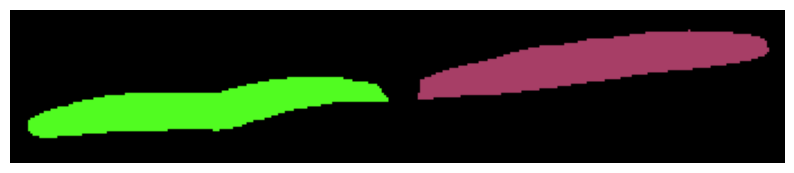

In [335]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage import color
import random

def generate_unique_color(existing_colors):
    """
    Generate a unique random color that's not in existing_colors.
    """
    while True:
        new_color = [random.randint(0, 255) for _ in range(3)]
        if not any((np.array(new_color) == x).all() for x in existing_colors):
            return new_color

# Load the .npz file with allow_pickle=True
mask_data = np.load('./tiny.jpg.npz', allow_pickle=True)

# Specify the path to your image
image_path = './tiny.jpg'

# Load the image
image = mpimg.imread(image_path)

# Prepare a canvas with the same dimensions as the image but all zeros (black)
overlay = np.zeros_like(image)

# Store used colors to ensure uniqueness
used_colors = []

# Loop through each mask
for i, mask in enumerate(mask_data['arr_4']):
    segmentation_info = mask
    segmentation_mask = segmentation_info['segmentation']
    
    # Resize the mask to match the image's dimensions
    # resized_mask = cv2.resize(segmentation_mask.astype(float), (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    # resized_mask = resized_mask > 0.5  # Make sure the mask is binary

    # Generate a unique color for this mask
    unique_color = generate_unique_color(used_colors)
    used_colors.append(unique_color)
    
    # Apply the color to the overlay where the mask is true
    overlay[segmentation_mask] = unique_color

# Blend the original image and the overlay
# Convert overlay to float and scale from 0 to 1 for blending
overlay_float = overlay.astype(np.float64) / 255
image_float = image.astype(np.float64) / 255
blended_image = (overlay_float + image_float) / 2

# Display the blended image
plt.figure(figsize=(10, 10))
plt.imshow(overlay)
plt.axis('off')
plt.show()


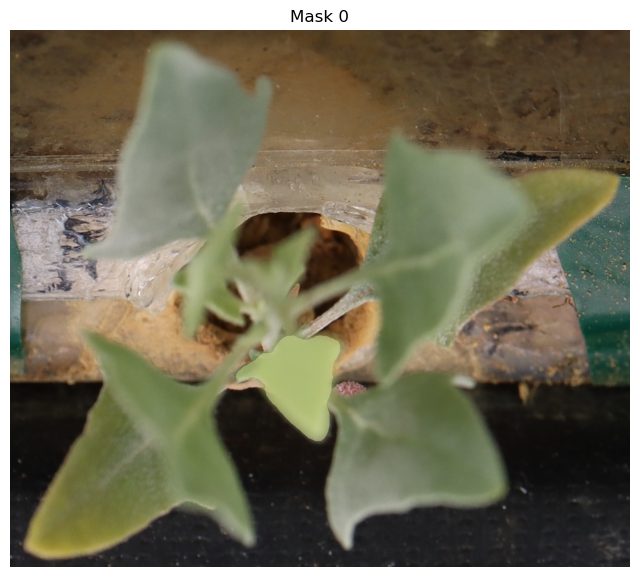

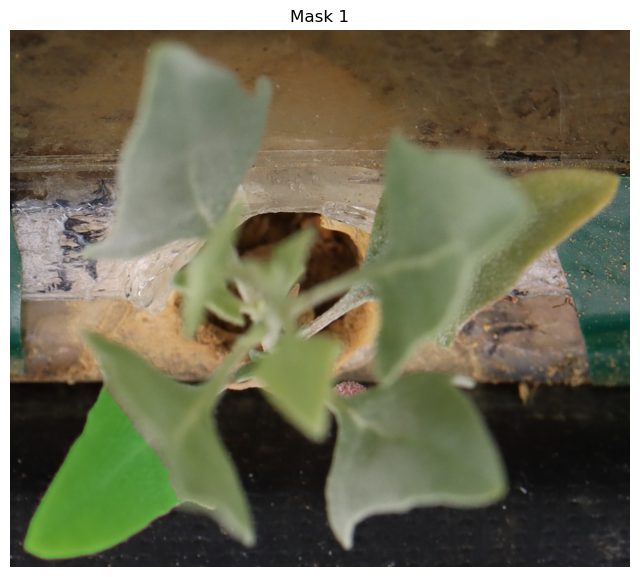

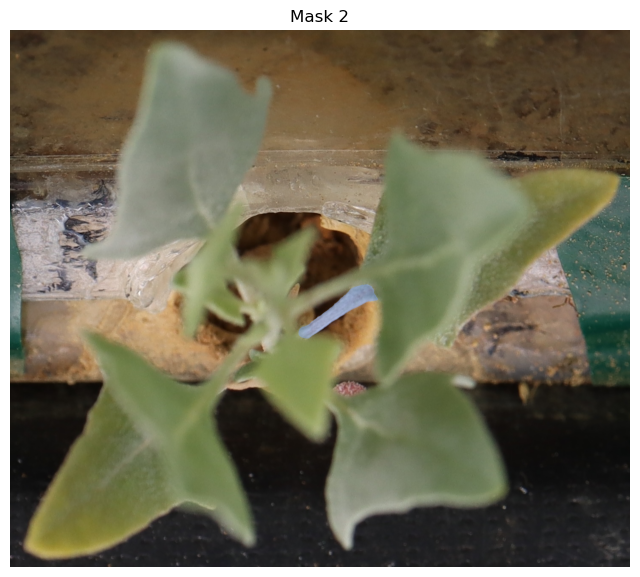

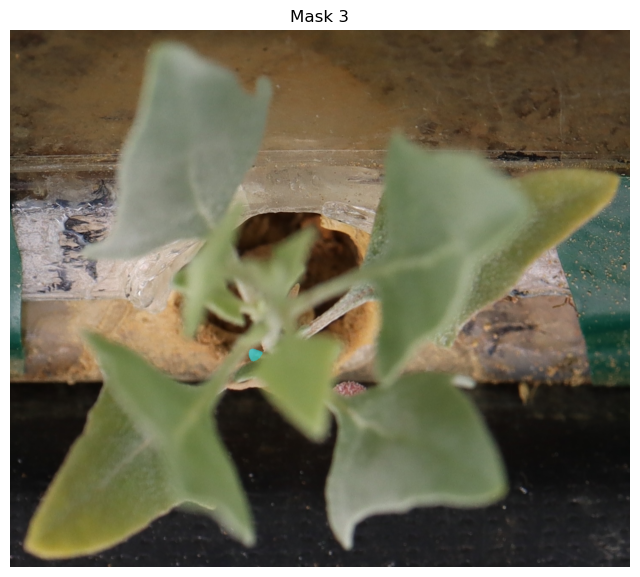

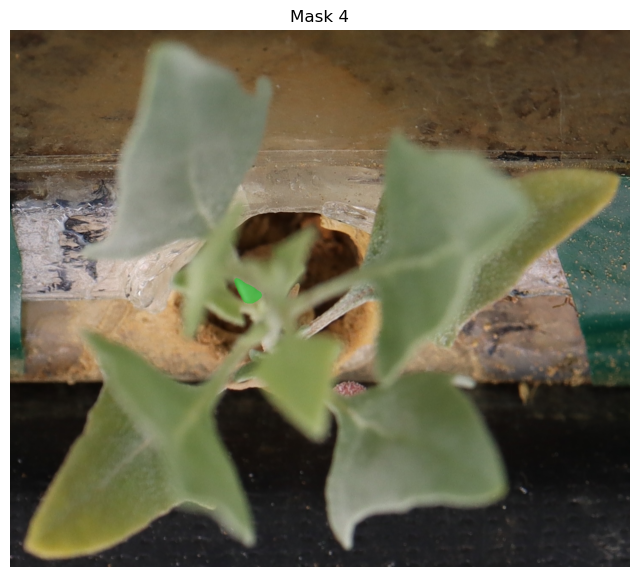

...

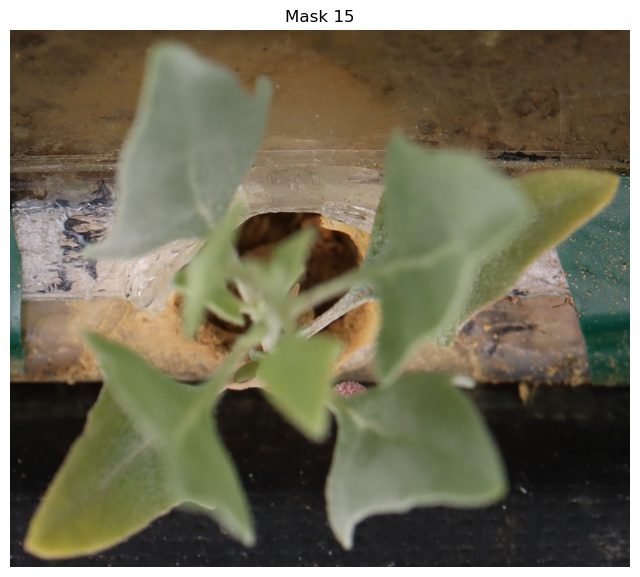

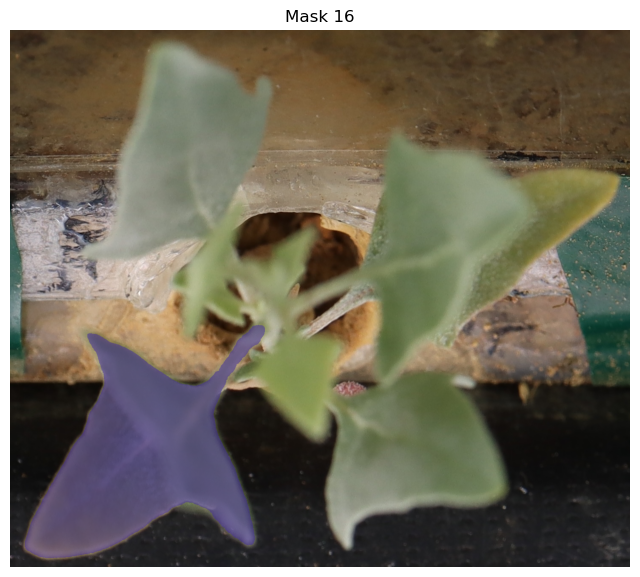

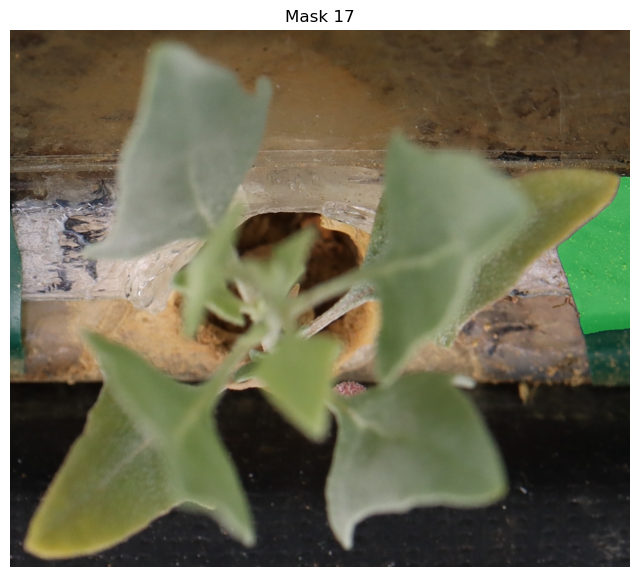

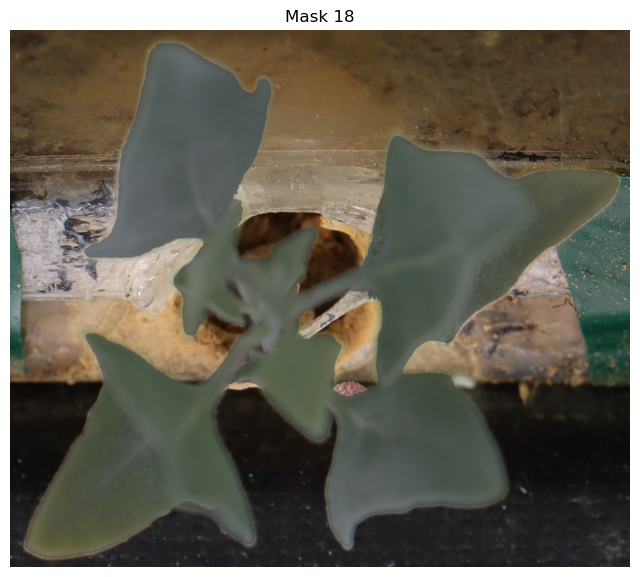

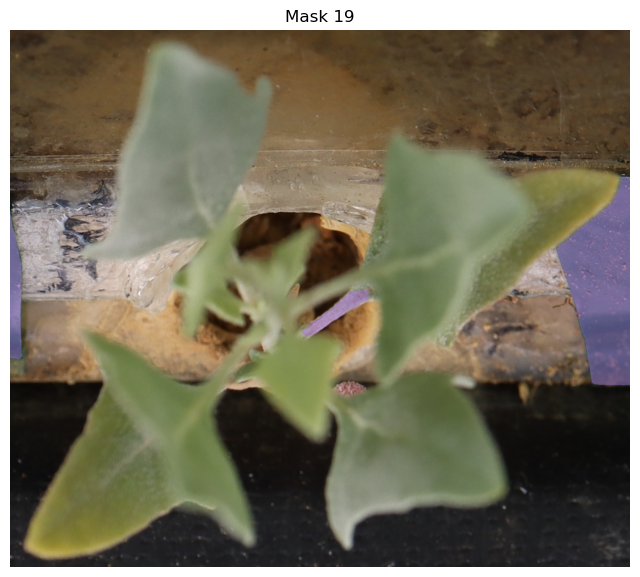

In [320]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Load the .npz file with allow_pickle=True
mask_data = np.load('blurred2.jpg.npz', allow_pickle=True)

# Specify the path to your image
image_path = './blurred2.jpg'

# Load the image
image = mpimg.imread(image_path)

def apply_mask_to_image(image, mask):
    """
    Apply a single mask to the image, creating a colored overlay
    """
    # Create an overlay that is a copy of the original image
    overlay = image.copy()
    
    # Generate a random color for the mask
    color = np.array([random.randint(0, 255) for _ in range(3)], dtype=np.uint8)
    
    # Resize mask to match image dimensions
    resized_mask = cv2.resize(mask.astype(float), (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    resized_mask = resized_mask > 0.5  # Ensure binary mask
    
    # Apply the color to the overlay where the mask is true
    overlay[resized_mask] = overlay[resized_mask] * 0.5 + color * 0.5
    
    return overlay

# Iterate through each mask and display it with the original image
for i, mask in enumerate(mask_data['arr_1']):
    segmentation_info = mask
    segmentation_mask = segmentation_info['segmentation']
    
    # Apply the current mask to the image
    masked_image = apply_mask_to_image(image, segmentation_mask)
    
    # Display the image with the current mask applied
    plt.figure(figsize=(8, 8))
    plt.imshow(masked_image)
    plt.title(f'Mask {i}')
    plt.axis('off')
    plt.show()


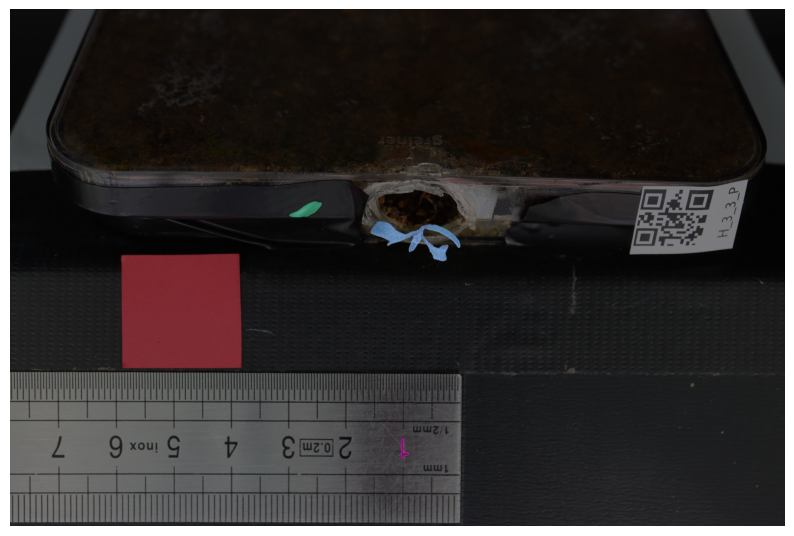

In [342]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage import color
import random

def generate_unique_color(existing_colors):
    """
    Generate a unique random color that's not in existing_colors.
    """
    while True:
        new_color = [random.randint(0, 255) for _ in range(3)]
        if not any((np.array(new_color) == x).all() for x in existing_colors):
            return new_color

# Load the .npz file with allow_pickle=True
mask_data = np.load('./leaves/IMG_5865leafonly_allmasks.npz', allow_pickle=True)

# Specify the path to your image
image_path = '../data/leaves/IMG_5865.JPG'

# Load the image
image = mpimg.imread(image_path)

# Prepare a canvas with the same dimensions as the image but all zeros (black)
overlay = np.zeros_like(image)

# Store used colors to ensure uniqueness
used_colors = []

# Loop through each mask


for i, mask in enumerate(mask_data['arr_2']):
    segmentation_info = mask
    segmentation_mask = segmentation_info['segmentation']
    
    # Resize the mask to match the image's dimensions
    resized_mask = cv2.resize(segmentation_mask.astype(float), (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    resized_mask = resized_mask > 0.5  # Make sure the mask is binary

    # Generate a unique color for this mask
    unique_color = generate_unique_color(used_colors)
    used_colors.append(unique_color)
    
    # Apply the color to the overlay where the mask is true
    overlay[resized_mask] = unique_color

# Blend the original image and the overlay
# Convert overlay to float and scale from 0 to 1 for blending
overlay_float = overlay.astype(np.float64) / 255
image_float = image.astype(np.float64) / 255
blended_image = (overlay_float + image_float) / 2

# Display the blended image
plt.figure(figsize=(10, 10))
plt.imshow(blended_image)
plt.axis('off')
plt.show()